## Config and connect to drive

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import os
os.chdir('/content/gdrive/My Drive/Thesis/split_data')
!pwd

/content/gdrive/My Drive/Thesis/split_data


In [ ]:
!pwd

/content/gdrive/My Drive/Thesis/split_data


## Import Library

In [ ]:
import numpy as np
from PIL import Image
from matplotlib import pyplot
import os
import glob
import matplotlib.pyplot as plt
from imgaug import augmenters as iaa
from scipy.ndimage import gaussian_filter
from sklearn.utils import shuffle
import pickle

# Model Library
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV

# Tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model, save_model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization, Conv2D, MaxPooling2D
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
import itertools
import copy
import matplotlib.pyplot as plt

## Read Image

In [ ]:
# Read the image (TIFF File)

import numpy as np
from PIL import Image

def read_image (file_paths):
  X = []
  y = [] # 0 is sober and 1 is drunk

  for file_name in file_paths:
    thermal_image = np.zeros((128,160))
    with Image.open(file_name) as img:
      for i in range(img.n_frames):
        img.seek(i)
        frame_data = np.array(img)
        min_value = np.amin(frame_data)
        frame_data -= min_value
        for j in range(img.height):
          for k in range(img.width):
            thermal_image[j,k] += frame_data[j,k]
      X.append(thermal_image)

      if '_1_f' in file_name: #Only first picture is sober (f: face)
        y.append(0)
      else:
        y.append(1)


      
      print(file_name)
      print(thermal_image)
  
  return X, y

In [ ]:
# Read single image
image_direction = '/content/gdrive/My Drive/Thesis/split_data/test/09_giorg/09_giorg_1_f_M_23_52.tif'
X,y = read_image([image_direction])

/content/gdrive/My Drive/Thesis/split_data/test/09_giorg/09_giorg_1_f_M_23_52.tif
[[ 735.  666.  669. ... 1826. 1668. 1754.]
 [ 750.  635.  837. ... 2071. 1804. 1607.]
 [ 718.  855.  829. ... 2113. 1918. 1650.]
 ...
 [   0.    0.    0. ...    0.    0.    0.]
 [   0.    0.    0. ...    0.    0.    0.]
 [   0.    0.    0. ...    0.    0.    0.]]


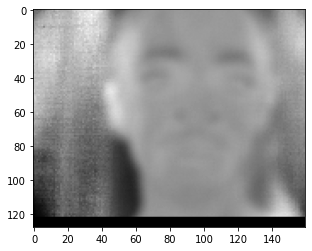

In [ ]:
#Plot the Image
from matplotlib import pyplot
pyplot.imshow(X_train[5], cmap = 'gray')

## Collect face image to pickle file

In [ ]:
import os
import glob
import matplotlib as plt

DIR_NAME = 'split_data'

os.chdir(f'../{DIR_NAME}')
DATA_DIR = os.getcwd()

In [ ]:
# Process with Train data
os.chdir(os.path.join(DATA_DIR,'train'))
HOME = os.getcwd()

import pickle

X_train = None
y_train = None

if os.path.exists('train.pkl'):
  (X_train, y_train) = pickle.load(open('train.pkl','rb'))
else:
  #Get fullpaths
  file_paths = []
  subjects = glob.glob('*')
  for subject in subjects:
    for i in range (1,5): #Face picture from 1 to 4
      facial_img = glob.glob(f'{subject}/*{i}_f*')
      for facial_path in facial_img:
        file_paths.append(os.path.join(HOME, facial_path))
      if not facial_img:
        print(f'{subject} is not found')
  
  X_train, y_train = read_image(file_paths)
  pickle.dump((X_train, y_train), open('train.pkl','wb'))

In [ ]:
# Process with Test data
os.chdir(os.path.join(DATA_DIR, 'test'))
HOME = os.getcwd()

X_test = None
y_test = None

if os.path.exists('test.pkl'):
  (X_test, y_test) = pickle.load(open('test.pkl', 'rb'))
else:
  #Get fullpaths
  file_paths = []
  subjects = glob.glob('*')
  for subject in subjects:
    for i in range(1,5):
      facial_img = glob.glob(f'{subject}/*{i}_f*')
      for facial_path in facial_img:
        file_paths.append(os.path.join(HOME, facial_path))
      if not facial_img:
        print(f'{subject} is not found')
  
  X_test, y_test = read_image(file_paths)
  pickle.dump((X_test, y_test), open('test.pkl','wb'))


In [ ]:
# Process with Validation data
os.chdir(os.path.join(DATA_DIR,'validation'))
HOME = os.getcwd()

X_validation = None
y_validation = None

if os.path.exists('validation.pkl'):
  (X_validation, y_validation) = pickle.load(open('validation.pkl','rb'))
else:
  #Get fullpaths
  file_paths = []
  subjects = glob.glob('*')
  for subject in subjects:
    for i in range(1,5):
      facial_img = glob.glob(f'{subject}/*{i}_f*')
      for facial_path in facial_img:
        file_paths.append(os.path.join(HOME, facial_path))
      if not facial_img:
        print(f'{subject} is not found')
  
  X_validation, y_validation = read_image(file_paths)
  pickle.dump((X_validation, y_validation), open('validation.pkl','wb'))


In [ ]:
assert(len(X_validation) == len(y_validation))
assert(len(X_test) == len(y_test))
assert(len(X_train) == len(y_train))

print(len(X_validation))
print(len(X_test))
print(len(X_train))


24
36
103


## Data Augmentation

In [ ]:
#Import library
from imgaug import augmenters as iaa

In [ ]:
# Add Gaussian noise to original train image
row, col= np.array(X_train).shape[1:]
mean = 0
var = 25
sigma = var**0.5

gauss = np.random.normal(mean, sigma, (row, col))
gauss = gauss.reshape(row,col)
X_train_gaussian_noise = X_train + gauss

In [ ]:
# Add Gaussian noise to flipped image
flip_seq = iaa.Sequential([
  iaa.Fliplr(1) # Flip horizontally all image
])

# Flip
X_train_flipped = flip_seq(images = X_train)

# Add noise
row, col = np.array(X_train_flipped).shape[1:]
mean = 0
var = 9
sigma = var**0.5

gauss = np.random.normal(mean, sigma, (row, col))
gauss = gauss.reshape(row, col)
X_train_gaussian_noise_flip = X_train_flipped + gauss

In [ ]:
# Gaussian Blur to original train image
from scipy.ndimage import gaussian_filter
X_train_gaussian_filter = []
for i, train_img in enumerate(X_train):
  X_train_gaussian_filter.append(gaussian_filter(np.array(train_img), sigma = 3))

In [ ]:
# Concate the Training Image
X_train = np.concatenate((X_train, X_train_gaussian_noise_flip, X_train_gaussian_noise, X_train_gaussian_filter), axis = 0)
y_train = np.concatenate((y_train, y_train, y_train, y_train), axis = 0)

In [ ]:
#Augment data on validation and test

#Flip on validation set
X_validation_flipped = flip_seq(images = X_validation)
X_validation = np.concatenate((X_validation, X_validation_flipped), axis = 0)
y_validation = np.concatenate((y_validation, y_validation), axis = 0)

#Flip on test set
X_test_flipped = flip_seq(images = X_test)
X_test = np.concatenate((X_test, X_test_flipped), axis = 0)
y_test = np.concatenate((y_test, y_test), axis = 0)


In [ ]:
assert(len(X_validation) == len(y_validation))
assert(len(X_test) == len(y_test))
assert(len(X_train) == len(y_train))

print(len(X_validation))
print(len(X_test))
print(len(X_train))

48
72
412


In [ ]:
print(X_train[2])

[[0.09925773 0.08576881 0.08708454 ... 0.10812148 0.10513029 0.10111513]
 [0.09278652 0.08976469 0.0922967  ... 0.11145907 0.10708408 0.10441098]
 [0.09015911 0.09590123 0.10133726 ... 0.1091928  0.10654367 0.10343913]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


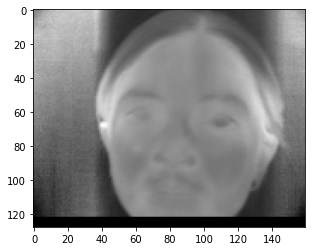

In [ ]:
from matplotlib import pyplot
pyplot.imshow(X_train[2], cmap = 'gray')

In [ ]:
# Normalize image
import tensorflow as tf

X_train = tf.keras.utils.normalize(X_train, axis = 1)
X_test = tf.keras.utils.normalize(X_test, axis = 1)
X_validation = tf.keras.utils.normalize(X_validation, axis = 1)

## Save and Read Preprocess Data

In [ ]:
# Save preprocessed data into pickle file
os.chdir('..')
# Test file
os.chdir(os.path.join(DATA_DIR, 'test'))

if os.path.exists('preprocess_test.pkl'):
  (X_test, y_test) = pickle.load(open('preprocess_test.pkl','rb'))
else:
  pickle.dump((X_test, y_test), open('preprocess_test.pkl','wb'))

# Train file
os.chdir(os.path.join(DATA_DIR, 'train'))

if os.path.exists('preprocess_train.pkl'):
  (X_train, y_train) = pickle.load(open('preprocess_train.pkl', 'rb'))
else:
  pickle.dump((X_train, y_train), open('preprocess_train.pkl','wb'))

# Validation file
os.chdir(os.path.join(DATA_DIR, 'validation'))

if os.path.exists('preprocess_validation.pkl'):
  (X_validation, y_validation) = pickle.load(open('preprocess_validation.pkl', 'rb'))
else:
  pickle.dump((X_validation, y_validation), open('preprocess_validation.pkl', 'wb'))

## Train Model

In [ ]:
# Shuffle function
# Shuffles a pair of equal size arrays in the same random order
# Returns a tuple of shuffled arrays
# Shuffle data for model.fit input
from sklearn.utils import shuffle

def shuffle_data(X_arr, y_arr):
  X_s = []
  y_s = []
  for X, y in shuffle(list(zip(X_arr, y_arr))):
    X_s.append(X)
    y_s.append(y) 
  return (np.array(X_s), np.array(y_s))

In [ ]:
# Flatten data 
X_train_2D = np.array([datum.flatten() for datum in X_train]) # Convert to (samples, features)
X_val_2D = np.array([datum.flatten() for datum in X_validation])
X_test_2D = np.array([datum.flatten() for datum in X_test])

y_train = np.array([datum.flatten() for datum in y_train]) #Convert to (412,1) (samples, 1)
y_test = np.array([datum.flatten() for datum in y_test])
y_validation = np.array([datum.flatten() for datum in y_validation])


### Voting Classifier

In [ ]:
# Decission Tree # 75%
def decission_tree():
  dt = DecisionTreeClassifier()
  dt.fit(X_train_2D, y_train.ravel())
  pred_y = dt.predict(X_val_2D)
  score = accuracy_score(y_validation, pred_y)
  print("Decission Tree accuracy: ", score)
  # print('Confusion matrix\n', confusion_matrix(y_test, pred_y))
  return dt, score

In [ ]:
dt, dt_score = decission_tree()

Decission Tree accuracy:  0.7291666666666666


In [ ]:
# Predict on test
pred_y = dt.predict(X_test_2D)
score = accuracy_score(y_test, pred_y)
print("Accuracy: ", score)
print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))

Accuracy:  0.7638888888888888
Confussion Matrix: 
 [[ 9  9]
 [ 8 46]]


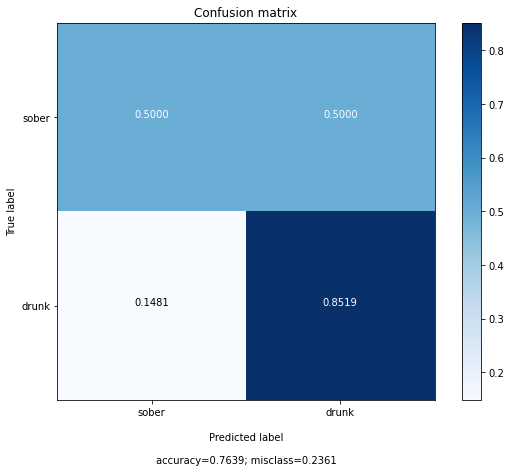

In [ ]:
plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )

In [ ]:
# K Nearest Neighbors #71%
def train_knn():
  knn = KNeighborsClassifier()
  knn.fit(X_train_2D, y_train.ravel())
  pred_y = knn.predict(X_val_2D)
  score = accuracy_score(y_validation, pred_y)
  print("KNN accuracy: ", score)
  return knn, score

In [ ]:
knn, knn_score = train_knn()

KNN accuracy:  0.7083333333333334


In [ ]:
# Predict on test
pred_y = knn.predict(X_test_2D)
score = accuracy_score(y_test, pred_y)
print("Accuracy: ", score)
print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))

Accuracy:  0.6527777777777778
Confussion Matrix: 
 [[ 8 10]
 [15 39]]


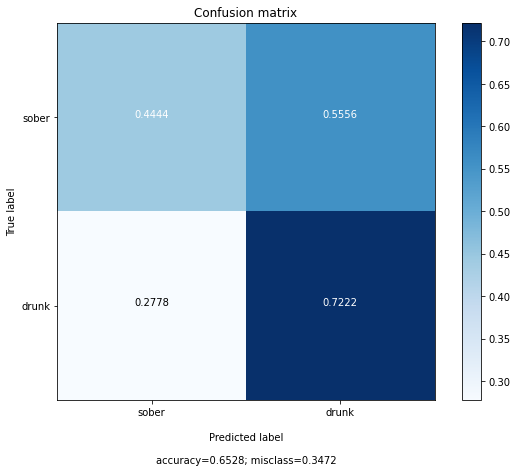

In [ ]:
plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )

In [ ]:
# Logistic Regression
def train_log_reg():
  log_reg = LogisticRegression(max_iter=500)
  log_reg.fit(X_train_2D, y_train.ravel())
  pred_y = log_reg.predict(X_test_2D)
  score = accuracy_score(y_test, pred_y)
  print("Logistic Regression accuracy: ", score)
  print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))
  plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )
  return score

Logistic Regression accuracy:  0.8333333333333334
Confussion Matrix: 
 [[ 8 10]
 [ 2 52]]


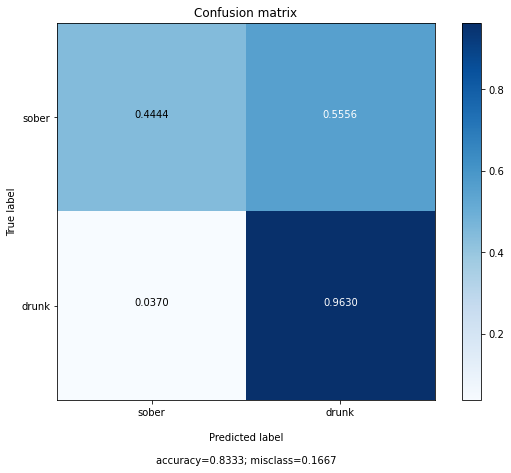

In [ ]:
lr_score = train_log_reg()

In [ ]:
# Multi_Layer Perceptron #75%
def train_mlp():
  parameters = {
      'learning_rate' : ['constant', 'invscaling', 'adaptive'],
      'activation' : ['identity', 'logistic', 'tanh', 'relu'],
      'solver' : ['lbfgs', 'sgd', 'adam']
  }
  mlp = MLPClassifier()
  clf = GridSearchCV(mlp, parameters)
  clf.fit(X_train_2D, y_train.ravel())
  pred_y = clf.predict(X_val_2D)
  print("MLP accuracy: ", accuracy_score(y_validation, pred_y))
  print("Best parameters: ", clf.best_params_)
  return mlp
  

In [ ]:
def train_mlp():
  mlp = MLPClassifier(activation='tanh', learning_rate='constant', solver='adam') #Best parameters
  mlp.fit(X_train_2D, y_train.ravel())
  pred_y = mlp.predict(X_val_2D)
  score = accuracy_score(y_validation, pred_y)
  print("MLP accuracy: ", score)
  return mlp, score

In [ ]:
mlp, mlp_score = train_mlp()

MLP accuracy:  0.75


Accuracy:  0.75
Confussion Matrix: 
 [[ 0 18]
 [ 0 54]]


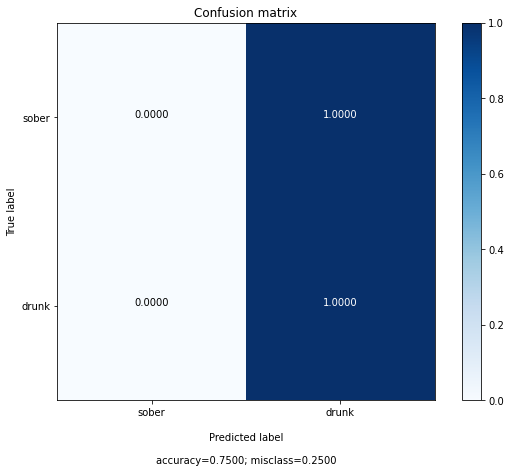

In [ ]:
# Predict on test
pred_y = mlp.predict(X_test_2D)
score = accuracy_score(y_test, pred_y)
print("Accuracy: ", score)
print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))
plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )

In [ ]:
# Random Forest # 83%
def train_rf():
  parameters = {
      'n_estimators' : [50, 100, 250, 500],
      'min_impurity_decrease' : [0,0.25, 0.5],
      'class_weight' : [None, 'balanced']
  }
  rf = RandomForestClassifier()
  clf = GridSearchCV(rf, parameters)
  clf.fit(X_train_2D, y_train.ravel())
  pred_y = clf.predict(X_val_2D)
  print("RF accuracy: ", accuracy_score(y_validation, pred_y))
  print("Best parameters: ", clf.best_params_)
  

In [ ]:
def train_rf():
  rf = RandomForestClassifier(n_estimators=250, class_weight='balanced', min_impurity_decrease=0)
  rf.fit(X_train_2D, y_train.ravel())
  pred_y = rf.predict(X_test_2D)
  score = accuracy_score(y_test, pred_y)
  print("Random Forest accuracy: ", score)
  print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))
  plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )
  return score

Random Forest accuracy:  0.8472222222222222
Confussion Matrix: 
 [[ 7 11]
 [ 0 54]]


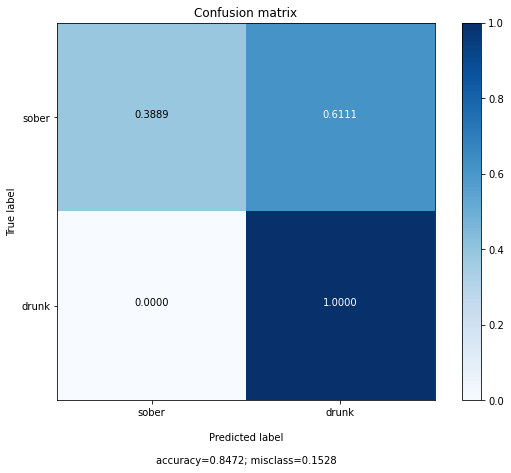

In [ ]:
rf_score = train_rf()

In [ ]:
#    # 79%
def train_sgd():
  sgd = SGDClassifier(loss='log')
  sgd.fit(X_train_2D, y_train.ravel())
  pred_y = sgd.predict(X_val_2D)
  score = accuracy_score(y_validation, pred_y)
  print("SGD accuracy: ", accuracy_score(y_validation, pred_y))
  return sgd, score

In [ ]:
sgd, sgd_score = train_sgd()

SGD accuracy:  0.8333333333333334


Accuracy:  0.7916666666666666
Confussion Matrix: 
 [[ 5 13]
 [ 2 52]]


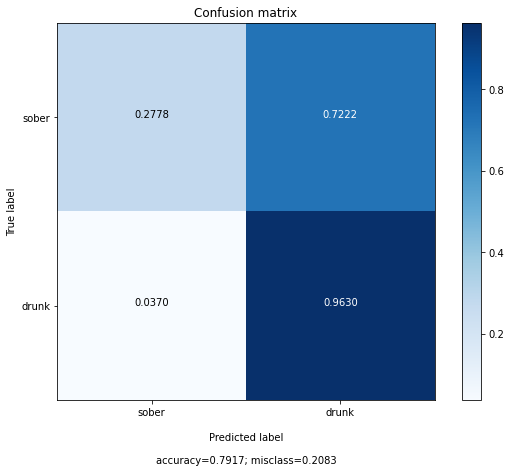

In [ ]:
# Predict on test
pred_y = sgd.predict(X_test_2D)
score = accuracy_score(y_test, pred_y)
print("Accuracy: ", score)
print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))
plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )

In [ ]:
# Support Vector Machine # 77%
def train_svm():
  svm = SVC(probability=True)
  svm.fit(X_train_2D, y_train.ravel())
  pred_y = svm.predict(X_val_2D)
  score = accuracy_score(y_validation, pred_y)
  print("SVM accuracy: ", score)
  return svm, score

In [ ]:
svm, svm_score = train_svm()

SVM accuracy:  0.7708333333333334


Accuracy:  0.7777777777777778
Confussion Matrix: 
 [[ 4 14]
 [ 2 52]]


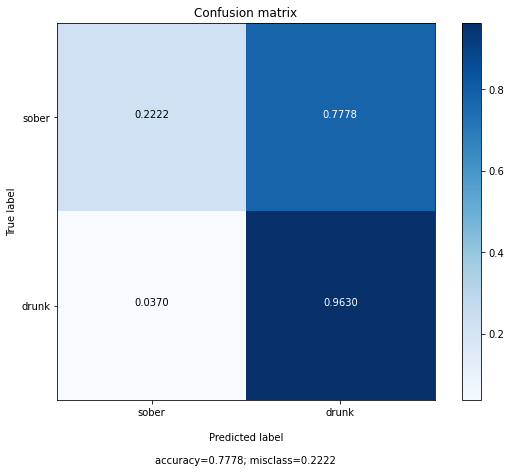

In [ ]:
# Predict on test
pred_y = svm.predict(X_test_2D)
score = accuracy_score(y_test, pred_y)
print("Accuracy: ", score)
print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))
plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )

In [ ]:
# Voting Classifier
def train_vote():
  lr = LogisticRegression(max_iter=500)
  rf = RandomForestClassifier(n_estimators=250, class_weight='balanced', min_impurity_decrease=0)
  voter = VotingClassifier(
      estimators=[('dt', dt), ('knn', knn), ('lr', lr), ('rf', rf), ('sgd', sgd), ('svm', svm)],
      voting='soft'
  )
  voter.fit(X_train_2D, y_train.ravel())
  pred_y = voter.predict(X_val_2D)
  score = accuracy_score(y_validation, pred_y)
  print("Votting Classifier accuracy: ", score)
  return voter, score


In [ ]:
voter, vote_score = train_vote()

Votting Classifier accuracy:  0.7916666666666666


Accuracy:  0.7638888888888888
Confussion Matrix: 
 [[ 7 11]
 [ 6 48]]


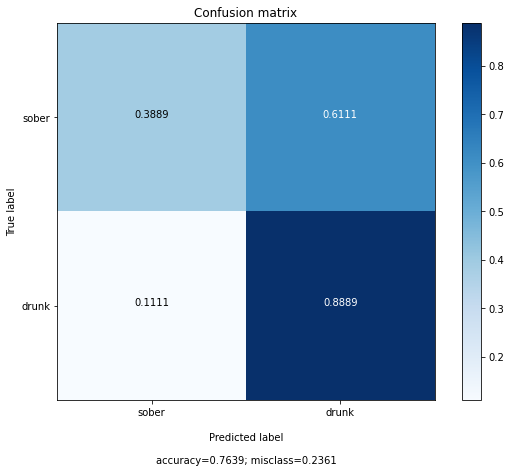

In [ ]:
# Predict on test
pred_y = voter.predict(X_test_2D)
score = accuracy_score(y_test, pred_y)
print("Accuracy: ", score)
print("Confussion Matrix: \n", confusion_matrix(y_test, pred_y))
plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )

In [ ]:
# Rank the model
import pandas as pd
models = pd.DataFrame({
    'Models' : ['Decision Tree', 'KNN', 'Logistic Regression', 'Multi-Layer Perceptron', 'Random Forest', 'Stochastic Gradient Descent','SVM'],
    'Score' : [round(dt_score,2), round(knn_score,2), round(lr_score,2), round(mlp_score,2), round(rf_score,2), round(sgd_score,2), round(svm_score,2)]
})
models.sort_values(by = 'Score', ascending= False)

,Models,Score
2,Logistic Regression,0.83
4,Random Forest,0.83
5,Stochastic Gradient Descent,0.79
6,SVM,0.77
0,Decision Tree,0.75
3,Multi-Layer Perceptron,0.75
1,KNN,0.71


### CNN Model

In [ ]:
# Shuffle data for CNN model
X_train, y_train = shuffle_data(X_train, y_train)
X_test, y_test = shuffle_data(X_test, y_test)
X_validation, y_validation = shuffle_data(X_validation, y_validation)

In [ ]:
# Only for X data, use np.array(y) for y data
# Returns data formatted for Keras CNN input
def cnn_data(data):
  x, y = data.shape[1:]
  return data.reshape((-1, x, y, 1))

#### Tuning hyperparameters

In [ ]:
def cnn_parameter_tuning():
  # get the shape of img
  x, y = X_train.shape[1:]

  # hyperparameters
  num_convlayers = [1, 2]
  convlayer_size = [8, 16]
  num_denselayers = [0, 1]
  denselayer_size = [8, 128]
  learning_rate = [0.01]
  batch_size = [32]

  # Create a list of all combinations of hyperparameters
  param_grid = list(itertools.product(
      num_convlayers, convlayer_size, 
      num_denselayers, denselayer_size,
      learning_rate, batch_size
  ))

  print(f'CNN hyperparameter tuning with {len(param_grid)} combinations')

  for i, param in enumerate(shuffle(param_grid)):
    
    print(f'Run {i}/{len(param_grid)}')

    # tuning hyperparameters
    num_convlayers, convlayer_size, num_denselayers, denselayer_size, learning_rate, batch_size = param

    NAME = f'n_conlayers = {num_convlayers}, conlayer_size = {convlayer_size}, num_denselayers = {num_denselayers}, denselayer_size = {denselayer_size}, learning_rate = {learning_rate}, batch_size = {batch_size}'
    tensorboard = TensorBoard(log_dir = f'logs/{NAME}')

    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor = 'val_accuracy',
        verbose = 1,
        patience = 30,
        mode = 'auto',
        restore_best_weights = False
    )

    model = Sequential()
    # Conv layer 1
    model.add(Conv2D(convlayer_size, (3, 3), input_shape = (x, y, 1)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size = (2,2)))

    # Addition Conv layer
    for _ in range(num_convlayers - 1): # Except first conv
      model.add(Conv2D(convlayer_size, (3,3)))
      model.add(Activation('relu'))
      model.add(MaxPooling2D(pool_size = (2,2)))
    
    # Dense Layer
    model.add(Flatten())
    for _ in range(num_denselayers):
      model.add(Dense(denselayer_size, activation = 'relu'))
    
    model.add(BatchNormalization())

    model.add(Dense(1))
    model.add(Activation ('sigmoid'))

    # Compile Model
    model.compile(
        loss='binary_crossentropy',
        optimizer=optimizers.Adam(learning_rate = learning_rate),
        metrics = ['accuracy']
    )

    # Treat every sober image with same weight as 3 drunk images
    class_weight = {0: (1/4)/2, 1: (3/4)/2}

    num_epochs = 1000
    model.fit(
        cnn_data(X_train), np.array(y_train),
        batch_size = batch_size,
        epochs = num_epochs,
        verbose = 1,
        class_weight = class_weight,
        validation_data = (cnn_data(X_validation), np.array(y_validation)),
        shuffle = True,
        use_multiprocessing = True,
        callbacks = [tensorboard, early_stopping]
    )
    
    save_model(model, NAME + f'FINAL-test_acc={model.evaluate(cnn_data(X_test),y_test)[1]}.hdf5')


In [ ]:
cnn_parameter_tuning()

#### Train CNN Model

In [ ]:
from tensorflow.python.keras.layers.pooling import AveragePooling2D
from tensorflow.python.keras.regularizers import L1L2, L2, L1

def train_cnn():
  
  early_stopping = tf.keras.callbacks.EarlyStopping(
  monitor = 'val_accuracy',
  verbose = 1,
  patience = 30,
  mode = 'auto',
  restore_best_weights = False
  )

  model = Sequential()

  #Layer 1
  x, y = X_train.shape[1:]
  model.add(Conv2D(64, kernel_size = (3,3), strides = (1, 1), padding='same', input_shape = (x, y, 1)))
  model.add(Activation('relu'))
  model.add(AveragePooling2D(pool_size = (2, 2), strides = (2, 2)))

  model.add(Conv2D(16, kernel_size = (5, 5), strides = (1, 1)))
  model.add(Activation('relu'))
  model.add(AveragePooling2D(pool_size = (2, 2), strides = (2, 2)))

  # Dense Layer
  model.add(Flatten())

  model.add(Dense(120, activation = 'relu'))
  model.add(Dense(84, activation = 'relu'))

  model.add(BatchNormalization())

  # Output Layer
  model.add(Dense(1))
  model.add(Activation('sigmoid'))

  model.compile(
      loss = 'binary_crossentropy',
      optimizer = optimizers.Adam(learning_rate = 0.01),
      metrics = ['accuracy']
  )

  # Treat every sober image with same weight as 3 drunk images
  class_weight = {0: (1/4)/2, 1: (3/4)/2}

  # Define hyperparameters
  board_num = 10

  NAME = f'{board_num}'
  tensorboard = TensorBoard(log_dir = f'logs/{NAME}')
  
  num_epochs = 1000

  model.fit(
        cnn_data(X_train), np.array(y_train),
        batch_size = 32,
        epochs = num_epochs,
        class_weight = class_weight,
        validation_data = (cnn_data(X_test), np.array(y_test)),
        shuffle = True,
        use_multiprocessing = True,
        callbacks = [tensorboard, early_stopping]
    )
      
  print(model.evaluate(cnn_data(X_test), np.array(y_test))[1])
  pred_y = (model.predict(cnn_data(X_test)) > 0.5).astype("int32")
  print('CNN accuracy:', accuracy_score(y_test, pred_y))
  print('CNN confusion matrix\n', confusion_matrix(y_test, pred_y))

  return model

In [ ]:
modeltest = train_cnn()

In [ ]:
def validate_optimized_model ():
  NAME = f'optimized Model1'
  tensorboard = TensorBoard(log_dir = f'logs/{NAME}')

  early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor = 'val_accuracy',
        verbose = 1,
        patience = 30,
        mode = 'auto',
        restore_best_weights = False
    )
  model = load_model('93_0.67.hdf5')
  
  # model.compile(
  #     loss = 'binary_crossentropy',
  #     optimizer = optimizers.Adam(learning_rate=0.01),
  #     metrics = ['accuracy']
  # )
  class_weight = {0: (1/4)/2, 1: (3/4)/2}
  num_epochs = 1000

  model.fit(
        cnn_data(X_train), np.array(y_train),
        batch_size = 32,
        epochs = num_epochs,
        # class_weight = class_weight,
        validation_data = (cnn_data(X_validation), np.array(y_validation)),
        shuffle = True,
        use_multiprocessing = True,
        callbacks = [tensorboard, early_stopping]
    )
      
  print(model.evaluate(cnn_data(X_test), np.array(y_test))[1])
  pred_y = (model.predict(cnn_data(X_test)) > 0.67).astype("int32")
  print('CNN accuracy:', accuracy_score(y_test, pred_y))
  print('CNN confusion matrix\n', confusion_matrix(y_test, pred_y))


In [ ]:
validate_optimized_model()

#### Tensor Board

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/

Output hidden; open in https://colab.research.google.com to view.

#### Test the best model

In [ ]:
def test_best_model():

  model = load_model('93_0.67.hdf5')
  pred_y  = (model.predict(cnn_data(X_test)) > 0.67).astype("int32")
  print('CNN accuracy:', accuracy_score(y_test, pred_y))
  print('CNN confusion matrix\n', confusion_matrix(y_test, pred_y))
  
  return model, pred_y

In [ ]:
model, pred_y = test_best_model()

CNN accuracy: 0.9305555555555556
CNN confusion matrix
 [[15  3]
 [ 2 52]]


In [ ]:
print(model.summary())

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_108 (Conv2D)         (None, 126, 158, 2)       20        
                                                                 
 activation_144 (Activation)  (None, 126, 158, 2)      0         
                                                                 
 max_pooling2d_108 (MaxPooli  (None, 63, 79, 2)        0         
 ng2D)                                                           
                                                                 
 conv2d_109 (Conv2D)         (None, 61, 77, 2)         38        
                                                                 
 activation_145 (Activation)  (None, 61, 77, 2)        0         
                                                                 
 max_pooling2d_109 (MaxPooli  (None, 30, 38, 2)        0         
 ng2D)                                               

In [ ]:
# Determine if a prediction is statistically significantly better than predicting all drunk
from statsmodels.stats.anova import AnovaRM
import pandas as pd
def test_model_significant(pred_y):
  subject = [] # Keep track of person
  correct = [] # Keep track of img predicted correctly
  model_name = [] # Keep track of corresponding model name

  for i, (true, pred) in enumerate(zip(y_test, pred_y)):
    subject.append(i)
    correct.append(int(true==pred))
    model_name.append("best")
  
  pred_drunk = []
  for _ in range(len(y_test)):
    pred_drunk.append(1)
  
  for i, (true, pred) in enumerate(zip(y_test, pred_drunk)):
    subject.append(i)
    correct.append(int(true==pred))
    model_name.append("drunk")
  
  anova_dic = {
      'Correct/Incorrect' : correct,
      'Test_ID' : subject,
      'Model_Name' : model_name
  }

  anova_df = pd.DataFrame(anova_dic)
  anova_rm = AnovaRM(data = anova_df, depvar = 'Correct/Incorrect', subject = 'Test_ID', within = ['Model_Name'])
  fit = anova_rm.fit()
  print(fit.summary())
  


In [ ]:
test_model_significant(pred_y)

                 Anova
           F Value Num DF  Den DF Pr > F
----------------------------------------
Model_Name 11.3735 1.0000 71.0000 0.0012



In [ ]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / np.sum(cm).astype('float')
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')
    
    if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names)
        plt.yticks(tick_marks, target_names)


    thresh = cm.max() / 2 
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('\nPredicted label\n\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    # plt.savefig('confusion_matrix.png')


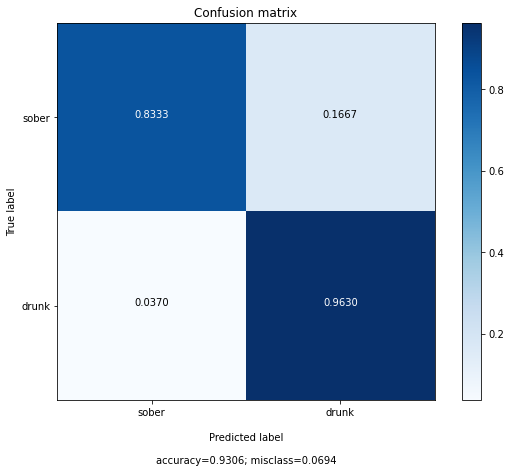

In [ ]:
plot_confusion_matrix(confusion_matrix(y_test, pred_y), target_names=['sober', 'drunk'] )

#### Demo Model / Prediction

In [ ]:
from PIL import Image, ImageOps
def add_border(pil_image, border, match):
  color = ''
  
  if match:
    color = 'green'
  else:
    color = 'red'
  
  pil_image = pil_image.convert('RGB')

  if isinstance(border, int) or isinstance(border, tuple):
    bimg = ImageOps.expand(pil_image, border, fill = color)
  else:
    raise RuntimeError("border is not int or tupe")
  
  return bimg


In [ ]:
def demo_model():
  print("Making prediction on 72 images in test set\n\n")

  state = ['sober','drunk']
  for i, (actual, pred) in enumerate(zip(y_test, pred_y)):
    if i > 0:
      print();
      print();
    bw = Image.fromarray(X_test[i]*1500).convert('L')
    newImg = add_border(bw, 10, int(actual)==int(pred))
    display(newImg)
    # newImg.save(f'{i}.png')
    print(f'Actual: {state[int(actual)]}, Predicted: {state[int(pred)]}')


Making prediction on 72 images in test set




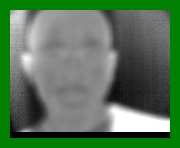

Actual: drunk, Predicted: drunk




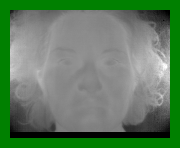

Actual: sober, Predicted: sober




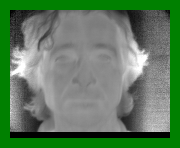

Actual: drunk, Predicted: drunk




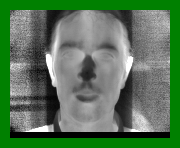

Actual: sober, Predicted: sober




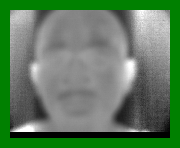

Actual: drunk, Predicted: drunk




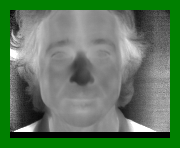

Actual: sober, Predicted: sober




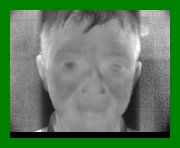

Actual: drunk, Predicted: drunk




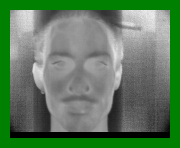

Actual: drunk, Predicted: drunk




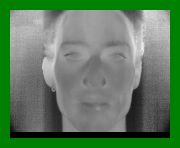

Actual: drunk, Predicted: drunk




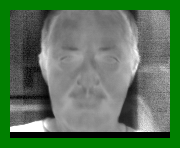

Actual: drunk, Predicted: drunk




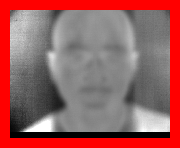

Actual: sober, Predicted: drunk




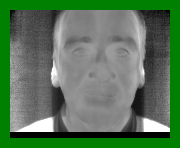

Actual: drunk, Predicted: drunk




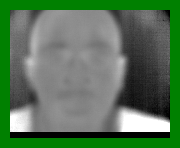

Actual: drunk, Predicted: drunk




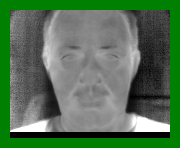

Actual: drunk, Predicted: drunk




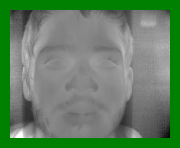

Actual: sober, Predicted: sober




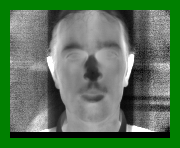

Actual: sober, Predicted: sober




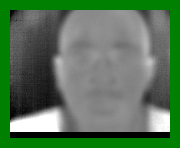

Actual: drunk, Predicted: drunk




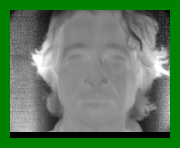

Actual: drunk, Predicted: drunk




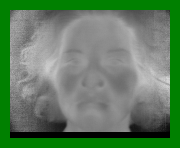

Actual: drunk, Predicted: drunk




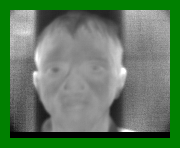

Actual: drunk, Predicted: drunk




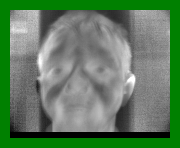

Actual: drunk, Predicted: drunk




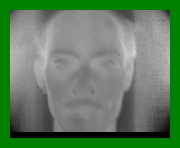

Actual: sober, Predicted: sober




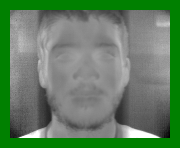

Actual: drunk, Predicted: drunk




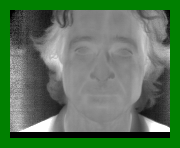

Actual: drunk, Predicted: drunk




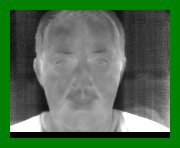

Actual: sober, Predicted: sober




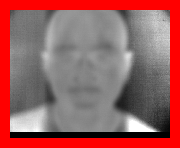

Actual: sober, Predicted: drunk




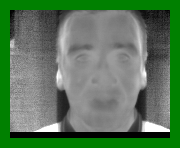

Actual: drunk, Predicted: drunk




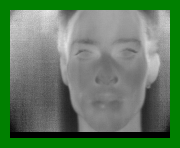

Actual: drunk, Predicted: drunk




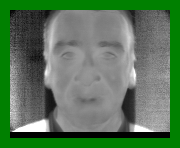

Actual: drunk, Predicted: drunk




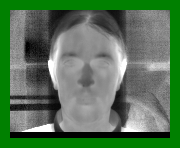

Actual: drunk, Predicted: drunk




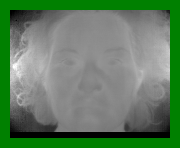

Actual: sober, Predicted: sober




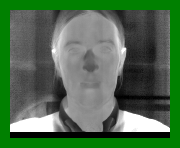

Actual: drunk, Predicted: drunk




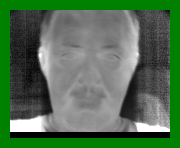

Actual: drunk, Predicted: drunk




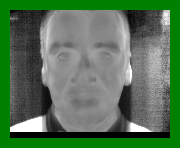

Actual: sober, Predicted: sober




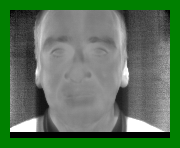

Actual: drunk, Predicted: drunk




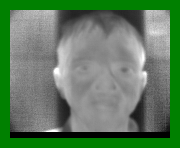

Actual: drunk, Predicted: drunk




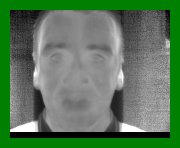

Actual: drunk, Predicted: drunk




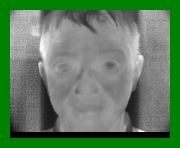

Actual: drunk, Predicted: drunk




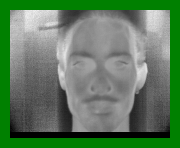

Actual: drunk, Predicted: drunk




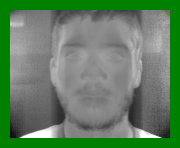

Actual: drunk, Predicted: drunk




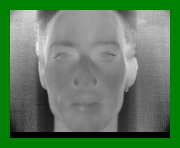

Actual: drunk, Predicted: drunk




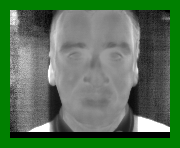

Actual: sober, Predicted: sober




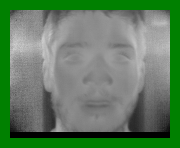

Actual: drunk, Predicted: drunk




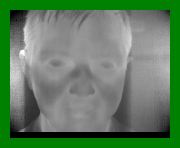

Actual: sober, Predicted: sober




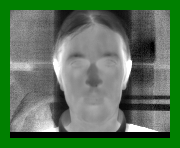

Actual: drunk, Predicted: drunk




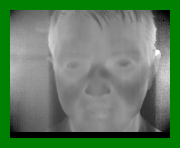

Actual: sober, Predicted: sober




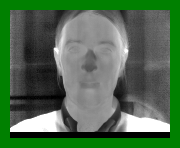

Actual: drunk, Predicted: drunk




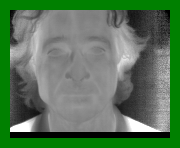

Actual: drunk, Predicted: drunk




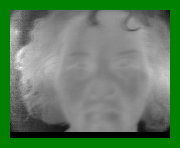

Actual: drunk, Predicted: drunk




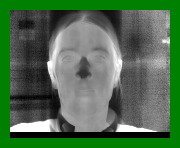

Actual: drunk, Predicted: drunk




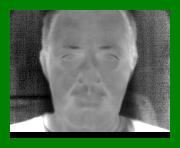

Actual: drunk, Predicted: drunk




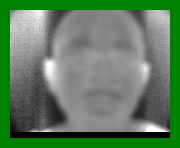

Actual: drunk, Predicted: drunk




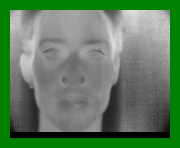

Actual: drunk, Predicted: drunk




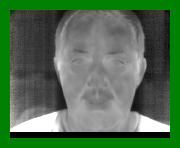

Actual: sober, Predicted: sober




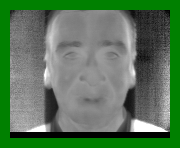

Actual: drunk, Predicted: drunk




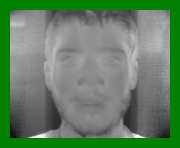

Actual: drunk, Predicted: drunk




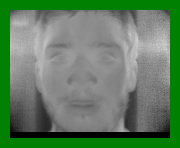

Actual: drunk, Predicted: drunk




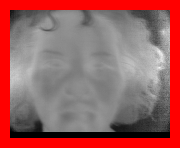

Actual: drunk, Predicted: sober




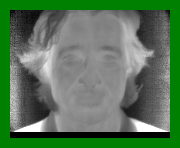

Actual: drunk, Predicted: drunk




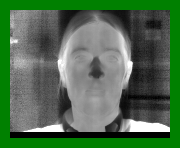

Actual: drunk, Predicted: drunk




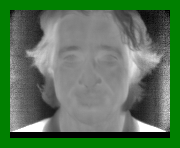

Actual: drunk, Predicted: drunk




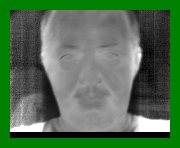

Actual: drunk, Predicted: drunk




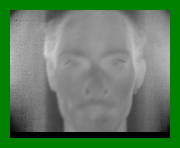

Actual: sober, Predicted: sober




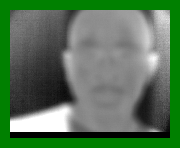

Actual: drunk, Predicted: drunk




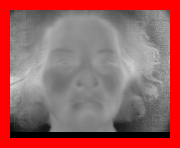

Actual: drunk, Predicted: sober




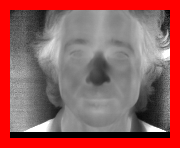

Actual: sober, Predicted: drunk




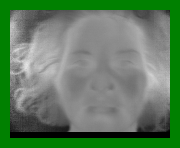

Actual: drunk, Predicted: drunk




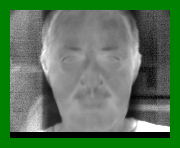

Actual: drunk, Predicted: drunk




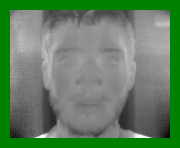

Actual: drunk, Predicted: drunk




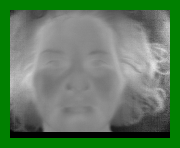

Actual: drunk, Predicted: drunk




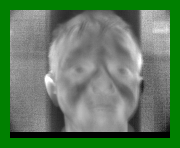

Actual: drunk, Predicted: drunk




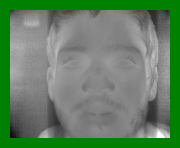

Actual: sober, Predicted: sober


In [ ]:
demo_model()